## Word clustering with Bert Embeddings

### Idea from https://github.com/huseinzol05/NLP-Models-Tensorflow/blob/master/topic-model/2.bert-topic.ipynb

In [31]:
import torch
from transformers import *
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
import json
import re

In [2]:
with open('datasets/data.json') as f:
    data = json.load(f)
data_list = []
for item in data:
    data_list.append(item['text'])
data_series = pd.Series(data_list)
data_series.head(5)

0    @lookner I taught a class in college on the co...
1                   this corona virus is scary as hell
2                     new corona virus is pretty scary
3    If Corona has a Virus?  I'm a dead man..  pic....
4    Corona Beer claims a conspiracy is behind the ...
dtype: object

In [3]:
# pat = r'^([a-zA-Z0-9]+(\.[a-zA-Z0-9]+)+.*)$'
data_series = data_series.str.replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

In [4]:
data_series.iloc[2983]

'I think so..\n#Virus_Corona pic.twitter.com/Kgj3kc28c7'

In [5]:
# can use any model from here https://huggingface.co/models
model = pipeline('feature-extraction',model='bert-base-multilingual-uncased')

In [6]:
sample_series = data_series#.sample(n=1000)
corpus = sample_series.str.lower().values.tolist()
display(sample_series.head(20))
len(corpus)

0     @lookner I taught a class in college on the co...
1                    this corona virus is scary as hell
2                      new corona virus is pretty scary
3     If Corona has a Virus?  I'm a dead man..  pic....
4     Corona Beer claims a conspiracy is behind the ...
5                         My Corona (virus)\n-The Knack
6                          Corona virus is a drunk bug.
7     So  I need to know more about this Corona Viru...
8     We are all so focus on taal, rightly so...but ...
9     WUHAN CHINA CDC THANKYOU FOR ALL YOUR HARD WOR...
10    This is shallow, but I'm relieved that Corona-...
11    Just in what are the hot trends, influencers r...
12     China confirms new corona virus transmitted b...
13    We were pleased to see @VassyKapelos have worl...
14    British tourist fighting for life in Thailand ...
15    Stay safe,strong and healthy  always in China ...
16    Should we be getting scared? Medics in Hazmat ...
17    Corona virus is not a mutation of the infl

9146

In [7]:
embedding = []
for c in tqdm(corpus):
    tmp = torch.tensor(model(c)).mean(1)
    embedding.append(tmp[0].numpy())

//anaconda3/envs/fastai2/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


In [8]:
n_clusters=10

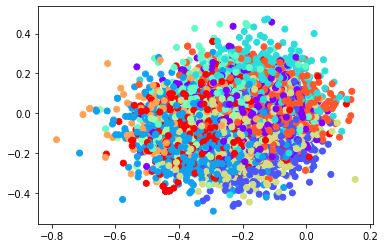

In [9]:
embedding = torch.tensor(embedding)
kmeans = KMeans(n_clusters=n_clusters)
y_kmeans = kmeans.fit_predict(embedding)
plt.scatter(embedding[:,0],embedding[:,1],c=y_kmeans,cmap='rainbow')

In [10]:
df = pd.DataFrame(sample_series,columns=['text'])

In [11]:
name = f'cluster'
df[name] = y_kmeans
df = df.sort_values(by=name)

In [12]:
df.head()

,text,cluster
4103,There’s somebody infected with the corona viru...,0
2455,It's because he has Corona Virus,0
8451,Corona virus is the only corona that I won't w...,0
5338,Corona virus is on a world wide spread.\n\nDo ...,0
846,Who is virus and what is he doing with a corona,0


In [13]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

import spacy
from spacy.lemmatizer import Lemmatizer
from spacy.lang.en.stop_words import STOP_WORDS
from outsource import *
from wordcloud import WordCloud,STOPWORDS
from functools import reduce
from collections import Counter

In [14]:
nlp= spacy.load("en")

# My list of stop words.
stop_list = ["Mrs.","Ms.","say","WASHINGTON","'s","Mr."," ",'\n\n '] + list(STOPWORDS)

# Updates spaCy's default stop words list with my additional words. 
nlp.Defaults.stop_words.update(stop_list)
nlp.Defaults.stop_words.update(malayStopwords)

# Iterates over the words in the stop words list and resets the "is_stop" flag.
for word in STOP_WORDS:
    lexeme = nlp.vocab[word]
    lexeme.is_stop = True
# The add_pipe function appends our functions to the default pipeline.
def lemmatizer(doc):
    # This takes in a doc of tokens from the NER and lemmatizes them. 
    # Pronouns (like "I" and "you" get lemmatized to '-PRON-', so I'm removing those.
    doc = [token.lemma_ for token in doc if token.lemma_ != '-PRON-']
    doc = u' '.join(doc)
    return nlp.make_doc(doc)
    
def remove_stopwords(doc):
    # This will remove stopwords and punctuation.
    # Use token.text to return strings, which we'll need for Gensim.
    doc = [token.text for token in doc if token.is_stop != True and token.is_punct != True]
    return doc

nlp.add_pipe(lemmatizer,name='lemmatizer',after='ner')
nlp.add_pipe(remove_stopwords, name="stopwords", last=True)

In [16]:
cluster_doc = []
for i in tqdm(range(n_clusters)):
    doc_list = []
#     set_trace()
    newest_doc = df[df.cluster==i].text
    for doc in tqdm(newest_doc):
        try:
            pr = nlp(doc)
            doc_list.append(pr)
        except:
            pr = nlp("")
            doc_list.append(pr)
    cluster_doc.append(doc_list)

//anaconda3/envs/fastai2/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


//anaconda3/envs/fastai2/lib/python3.7/site-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


In [17]:
cluster_top_words = []
for cd in cluster_doc:
    count = Counter(item for sublist in cd for item in sublist)
    top_word = [i[0] for i in count.most_common()[:40]]
    cluster_top_words.append(set(top_word))

In [30]:
# people talk about across cluster
[' '.join(list(c)).replace('\n','').replace('  ','') for c in cluster_top_words]

['China lime Corona corona spread know kill Virus disease people comethink drink cure virus new beer',
 'China Corona corona want start fuck know Virus people come thingdrink think virus new sick beer',
 'China Corona corona country spread chinese know outbreak Virus flu people die caseWuhan virus new infect',
 'China safe lime CORONA Corona corona spread Virus u\xa0 hope VIRUS drink scary virus new beer',
 'China coronavirus Corona corona spread Pandemic @YouTube Virus confirm Press human case\xa0 Wuhan virus new Mainstream',
 'China coronavirus Corona corona spread know outbreak Virus confirm human case come$ drink Wuhan virus new',
 'China feel Corona corona start know Virus people die thing come timethink drink virus bad beer',
 'China Corona corona spread start fuck know outbreak Virus Kobe people case comethink drink virus 2020',
 'China lime Corona corona good fuck catch Virus u sound die comehope drink think virus beer',
 'China coronavirus Corona corona death spread outbreak y

In [19]:
# remove top word across cluster because want to see local importance also
bias_words = set.intersection(*cluster_top_words)
bias_words

{'\n ', '  ', '   ', 'China', 'Corona', 'Virus', 'corona', 'virus'}

//anaconda3/envs/fastai2/lib/python3.7/site-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


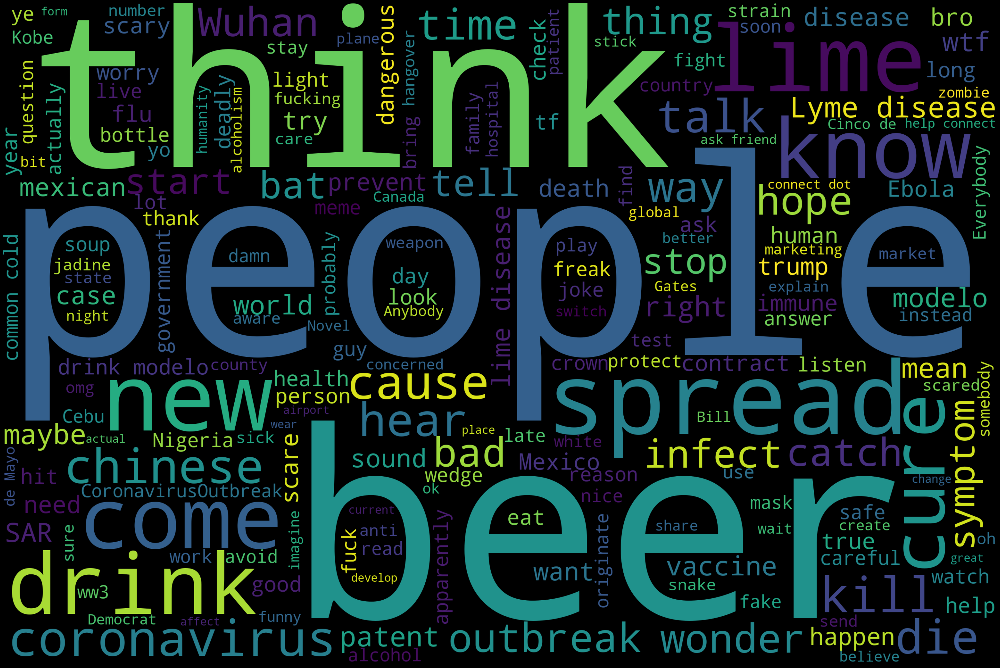

[(0, '0.033*"virus" + 0.028*"corona" + 0.017*"\n " + 0.014*"   " + 0.013*"try"'), (1, '0.147*"virus" + 0.125*"Corona" + 0.028*"   " + 0.022*"corona" + 0.017*"China"'), (2, '0.107*"virus" + 0.102*"Corona" + 0.031*"corona" + 0.021*"Virus" + 0.018*"think"'), (3, '0.135*"corona" + 0.126*"virus" + 0.020*"think" + 0.016*"kill" + 0.014*"drink"'), (4, '0.088*"virus" + 0.082*"Corona" + 0.026*"corona" + 0.010*"Virus" + 0.010*"new"'), (5, '0.068*"Corona" + 0.060*"virus" + 0.042*"Virus" + 0.030*"corona" + 0.029*"  "'), (6, '0.113*"Corona" + 0.103*"Virus" + 0.043*"virus" + 0.031*"corona" + 0.019*"beer"'), (7, '0.134*"virus" + 0.128*"corona" + 0.019*"spread" + 0.011*"vaccine" + 0.011*"Corona"'), (8, '0.068*"virus" + 0.043*"corona" + 0.018*"Corona" + 0.013*"human" + 0.013*"funny"'), (9, '0.179*"virus" + 0.147*"corona" + 0.032*"Corona" + 0.012*"lime" + 0.011*"people"')]


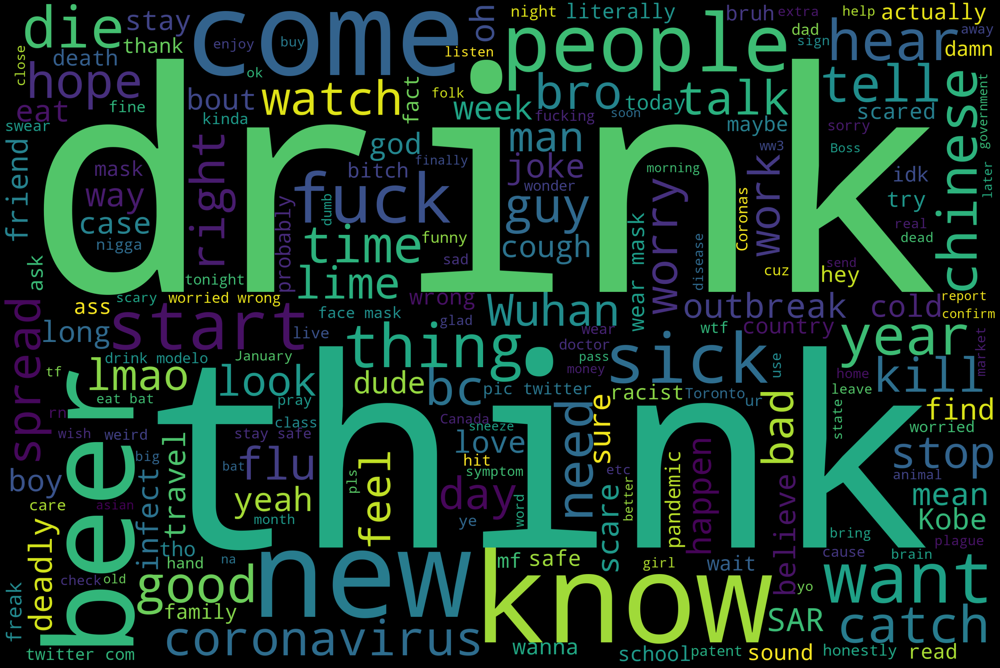

[(0, '0.060*"corona" + 0.054*"virus" + 0.016*"\n " + 0.007*"die" + 0.007*"   "'), (1, '0.056*"corona" + 0.052*"virus" + 0.025*"China" + 0.019*"come" + 0.009*"   "'), (2, '0.085*"virus" + 0.079*"corona" + 0.013*"u" + 0.013*"  " + 0.013*"   "'), (3, '0.073*"virus" + 0.061*"corona" + 0.020*"Corona" + 0.014*"think" + 0.013*"  "'), (4, '0.050*"virus" + 0.035*"corona" + 0.026*"Corona" + 0.017*"  " + 0.014*"drink"'), (5, '0.049*"virus" + 0.036*"corona" + 0.029*"Corona" + 0.013*"ass" + 0.013*"think"'), (6, '0.067*"virus" + 0.063*"corona" + 0.033*"Corona" + 0.024*"drink" + 0.018*"Virus"'), (7, '0.047*"virus" + 0.032*"corona" + 0.028*"Corona" + 0.014*"worry" + 0.011*"wrong"'), (8, '0.101*"virus" + 0.084*"corona" + 0.012*"   " + 0.012*"know" + 0.008*"die"'), (9, '0.069*"virus" + 0.058*"Corona" + 0.032*"corona" + 0.019*"Virus" + 0.013*"want"')]


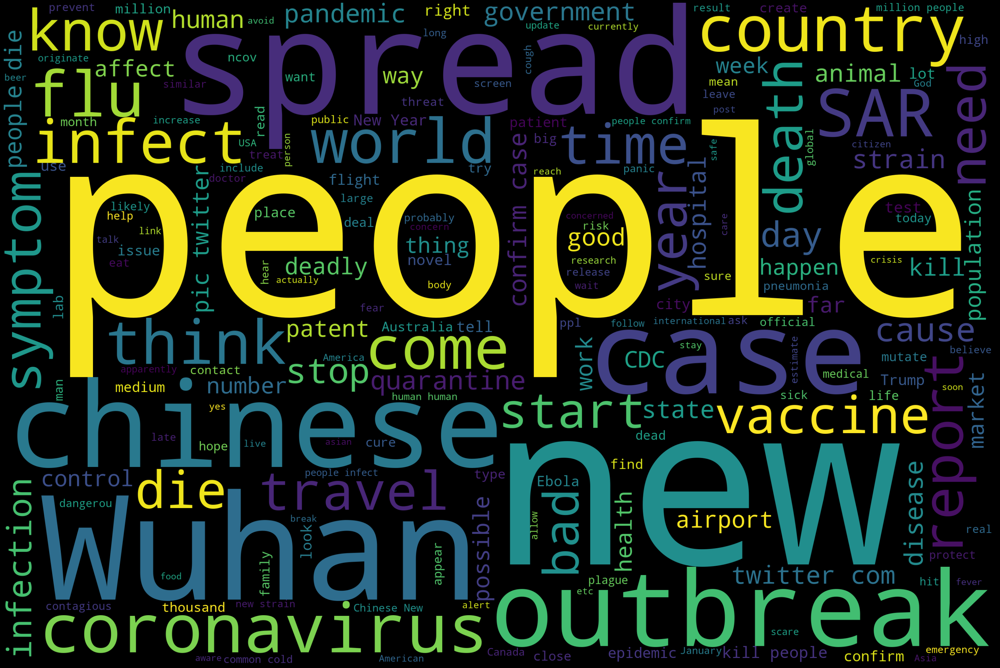

[(0, '0.025*"Corona" + 0.016*"virus" + 0.014*"\n " + 0.013*"people" + 0.009*"  "'), (1, '0.056*"virus" + 0.029*"corona" + 0.024*"Corona" + 0.022*"China" + 0.012*"Virus"'), (2, '0.038*"virus" + 0.035*"\n " + 0.025*"corona" + 0.018*"Corona" + 0.012*"people"'), (3, '0.045*"virus" + 0.030*"corona" + 0.019*"Corona" + 0.019*"  " + 0.017*"China"'), (4, '0.019*"virus" + 0.019*"people" + 0.016*"Corona" + 0.012*"Wuhan" + 0.011*"case"'), (5, '0.047*"virus" + 0.025*"corona" + 0.025*"Corona" + 0.021*"\n " + 0.017*"  "'), (6, '0.036*"virus" + 0.025*"Corona" + 0.021*"China" + 0.020*"  " + 0.020*"corona"'), (7, '0.060*"virus" + 0.031*"Corona" + 0.028*"corona" + 0.019*"people" + 0.017*"China"'), (8, '0.051*"virus" + 0.034*"corona" + 0.024*"China" + 0.019*"new" + 0.013*"case"'), (9, '0.054*"virus" + 0.039*"corona" + 0.012*"China" + 0.012*"Corona" + 0.012*"case"')]


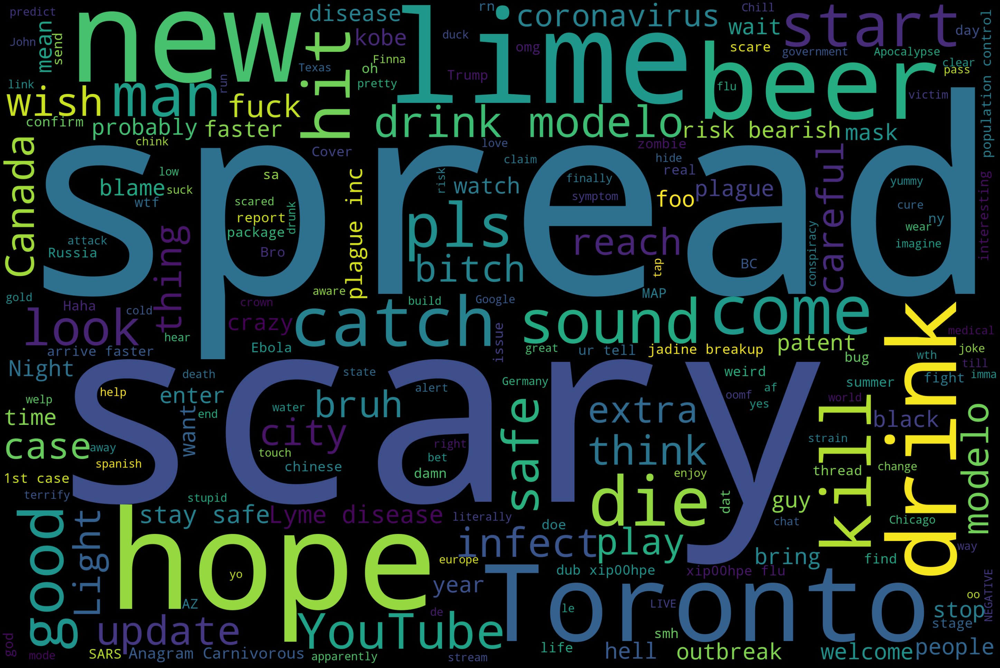

[(0, '0.033*"\n\n\xa0 " + 0.012*"virus" + 0.010*"  " + 0.009*"rlly" + 0.009*"ferda"'), (1, '0.173*"Corona" + 0.159*"Virus" + 0.033*"virus" + 0.032*"   " + 0.019*"  "'), (2, '0.221*"virus" + 0.121*"Corona" + 0.104*"corona" + 0.030*"   " + 0.011*"China"'), (3, '0.035*"Corona" + 0.027*"virus" + 0.020*"Virus" + 0.019*"corona" + 0.014*"Toronto"'), (4, '0.269*"corona" + 0.266*"virus" + 0.028*"   " + 0.012*"scary" + 0.011*"safe"'), (5, '0.060*"Corona" + 0.060*"virus" + 0.039*"corona" + 0.034*"Virus" + 0.030*"VIRUS"'), (6, '0.034*" \xa0 " + 0.032*"Corona" + 0.030*"virus" + 0.016*"coronavirus" + 0.015*"Light"'), (7, '0.199*"virus" + 0.131*"corona" + 0.069*"Corona" + 0.019*"   " + 0.017*"lime"'), (8, '0.042*"new" + 0.032*"corona" + 0.031*"virus" + 0.015*"suck" + 0.015*"till"'), (9, '0.057*"Corona" + 0.043*"virus" + 0.022*"bring" + 0.019*"probably" + 0.013*"apparently"')]


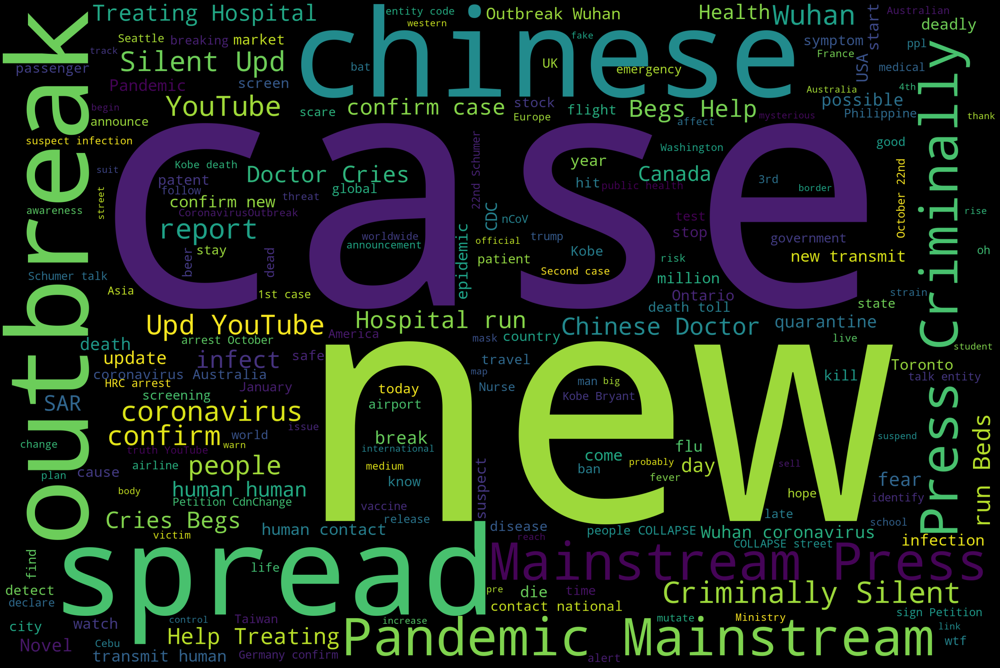

[(0, '0.056*"Corona" + 0.044*"   " + 0.044*"Virus" + 0.033*"Hospital" + 0.032*"Doctor"'), (1, '0.058*"virus" + 0.048*"Corona" + 0.040*"human" + 0.030*"   " + 0.025*"China"'), (2, '0.063*"Corona" + 0.043*"Virus" + 0.041*"   " + 0.037*"virus" + 0.027*"China"'), (3, '0.027*"Corona" + 0.019*"   " + 0.019*"Virus" + 0.014*"virus" + 0.011*"Airport"'), (4, '0.045*"\n " + 0.039*"Corona" + 0.035*"virus" + 0.027*"   " + 0.022*"Virus"'), (5, '0.074*"virus" + 0.057*"case" + 0.049*"corona" + 0.042*"Corona" + 0.031*"confirm"'), (6, '0.061*"Corona" + 0.049*"Virus" + 0.035*"virus" + 0.032*"\xa0  " + 0.031*"@YouTube"'), (7, '0.093*"virus" + 0.067*"corona" + 0.025*"Corona" + 0.019*"   " + 0.016*"\n "'), (8, '0.056*"Corona" + 0.035*"Virus" + 0.029*"China" + 0.020*"\xa0  " + 0.019*"   "'), (9, '0.057*"virus" + 0.056*"corona" + 0.020*"new" + 0.019*"   " + 0.015*"outbreak"')]


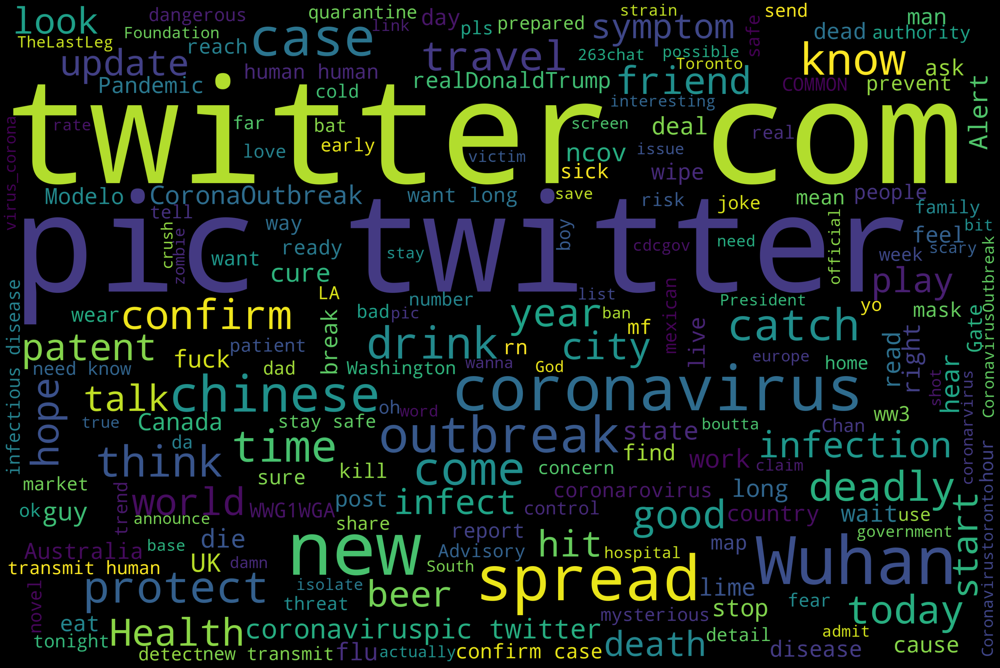

[(0, '0.089*"\n " + 0.042*"virus" + 0.040*"corona" + 0.009*"case" + 0.009*"patent"'), (1, '0.044*"Corona" + 0.029*"virus" + 0.021*"Virus" + 0.011*"corona" + 0.011*"China"'), (2, '0.057*"virus" + 0.051*"corona" + 0.015*"Corona" + 0.011*"China" + 0.011*"  "'), (3, '0.054*"Corona" + 0.044*"virus" + 0.038*"   " + 0.022*"Virus" + 0.019*"\n "'), (4, '0.070*"virus" + 0.052*"corona" + 0.026*"Corona" + 0.011*"Virus" + 0.006*"   "'), (5, '0.103*"virus" + 0.059*"corona" + 0.049*"Corona" + 0.017*"   " + 0.015*"  "'), (6, '0.080*"virus" + 0.061*"corona" + 0.025*"Corona" + 0.023*"   " + 0.011*"  "'), (7, '0.027*"Corona" + 0.025*"Virus" + 0.023*"  " + 0.021*"virus" + 0.021*"corona"'), (8, '0.037*"virus" + 0.024*"corona" + 0.015*"Corona" + 0.010*"\n " + 0.007*"tamupic.twitter.com/9mh4mjeywv"'), (9, '0.069*"Corona" + 0.058*"Virus" + 0.035*"   " + 0.030*"virus" + 0.018*"corona"')]


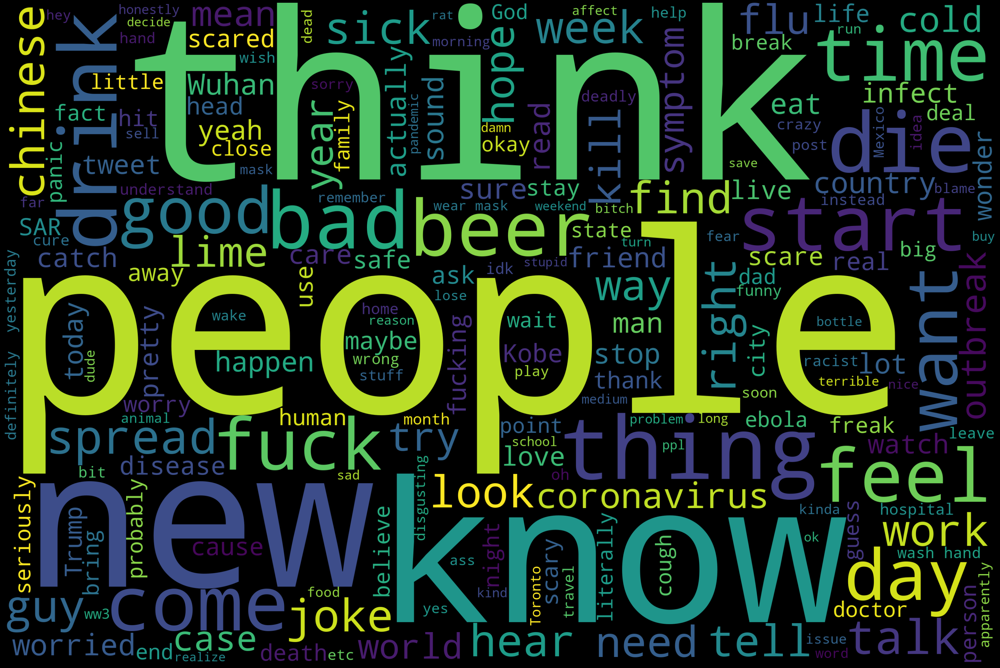

[(0, '0.037*"virus" + 0.023*"corona" + 0.018*"Corona" + 0.012*"start" + 0.005*"think"'), (1, '0.059*"virus" + 0.034*"corona" + 0.032*"Corona" + 0.020*"\n " + 0.019*"  "'), (2, '0.046*"virus" + 0.027*"corona" + 0.027*"Corona" + 0.011*"   " + 0.010*"right"'), (3, '0.031*"corona" + 0.031*"virus" + 0.015*"crush" + 0.014*"admit" + 0.012*"wanna"'), (4, '0.057*"virus" + 0.037*"corona" + 0.030*"Corona" + 0.020*"  " + 0.012*"Virus"'), (5, '0.023*"virus" + 0.019*"Corona" + 0.009*"corona" + 0.007*"Virus" + 0.005*"come"'), (6, '0.087*"virus" + 0.064*"corona" + 0.023*"Corona" + 0.013*"people" + 0.010*"think"'), (7, '0.052*"Corona" + 0.034*"Virus" + 0.030*"virus" + 0.014*"people" + 0.014*"corona"'), (8, '0.075*"virus" + 0.041*"corona" + 0.039*"Corona" + 0.013*"people" + 0.011*"\n "'), (9, '0.069*"virus" + 0.052*"corona" + 0.020*"Corona" + 0.015*"think" + 0.009*"die"')]


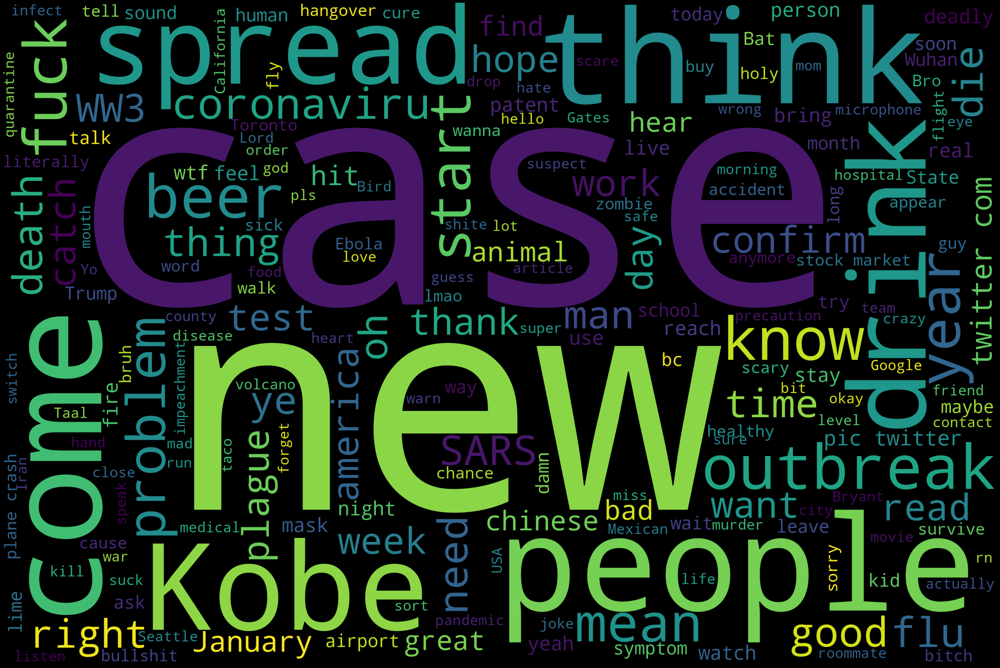

[(0, '0.041*"virus" + 0.031*"corona" + 0.014*"Corona" + 0.014*"come" + 0.011*"think"'), (1, '0.074*"virus" + 0.047*"corona" + 0.047*"Corona" + 0.035*"\n " + 0.018*"Virus"'), (2, '0.081*"Corona" + 0.043*"virus" + 0.033*"Virus" + 0.028*"\n " + 0.021*"Kobe"'), (3, '0.074*"virus" + 0.068*"corona" + 0.015*"<" + 0.012*"VIRUS" + 0.012*"  "'), (4, '0.080*"virus" + 0.067*"corona" + 0.018*"  " + 0.017*"Corona" + 0.009*"problem"'), (5, '0.099*"virus" + 0.098*"corona" + 0.020*"   " + 0.010*"China" + 0.007*"people"'), (6, '0.084*"virus" + 0.081*"Corona" + 0.022*"China" + 0.021*"corona" + 0.021*"   "'), (7, '0.049*"virus" + 0.040*"corona" + 0.033*"Corona" + 0.011*"Virus" + 0.011*"wide"'), (8, '0.062*"Corona" + 0.050*"virus" + 0.042*"Virus" + 0.027*"corona" + 0.019*"case"'), (9, '0.064*"\n " + 0.059*"virus" + 0.030*"corona" + 0.027*"Corona" + 0.013*"CORONA"')]


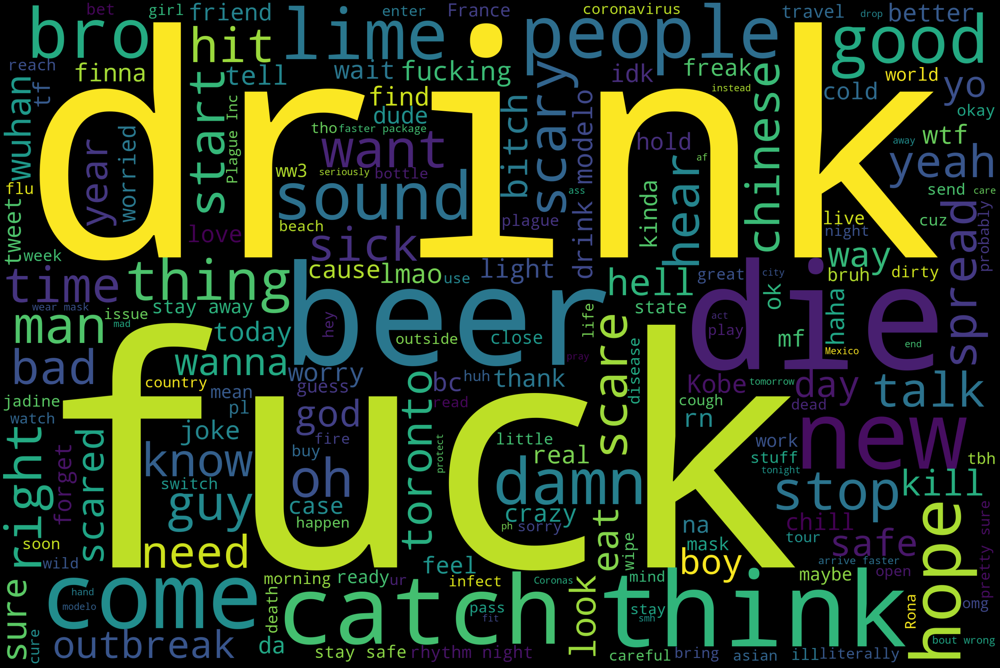

[(0, '0.032*"Corona" + 0.023*"virus" + 0.020*"Virus" + 0.016*"people" + 0.011*"crazy"'), (1, '0.077*"virus" + 0.067*"corona" + 0.013*"talk" + 0.012*"hand" + 0.009*"drink"'), (2, '0.132*"virus" + 0.127*"corona" + 0.024*"drink" + 0.015*"beer" + 0.011*"catch"'), (3, '0.098*"virus" + 0.070*"corona" + 0.030*"Corona" + 0.014*"   " + 0.010*"oh"'), (4, '0.076*"corona" + 0.074*"virus" + 0.042*"Corona" + 0.027*"Virus" + 0.023*"lime"'), (5, '0.073*"virus" + 0.062*"corona" + 0.042*"Corona" + 0.025*"Virus" + 0.012*"  "'), (6, '0.073*"Corona" + 0.053*"virus" + 0.042*"Virus" + 0.033*"  " + 0.031*"corona"'), (7, '0.074*"virus" + 0.065*"corona" + 0.020*"Corona" + 0.015*"  " + 0.015*"fuck"'), (8, '0.132*"virus" + 0.087*"corona" + 0.045*"Corona" + 0.014*"die" + 0.012*"drink"'), (9, '0.139*"virus" + 0.113*"corona" + 0.025*"Corona" + 0.011*"\n " + 0.010*"   "')]


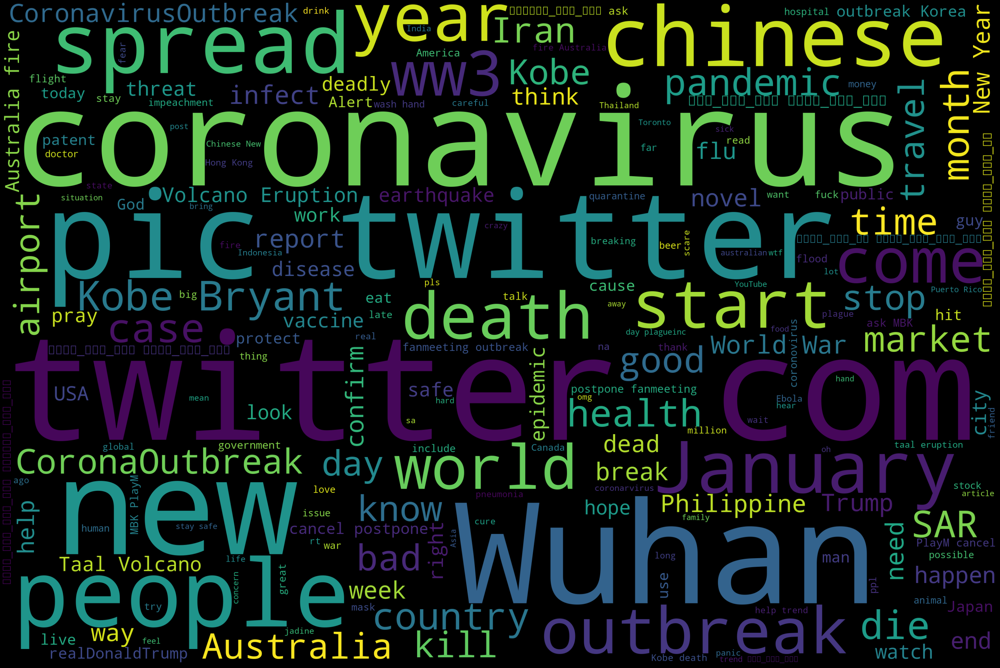

[(0, '0.020*"virus" + 0.016*"corona" + 0.014*"Corona" + 0.009*"Virus" + 0.007*"people"'), (1, '0.069*"\n " + 0.042*"virus" + 0.032*"corona" + 0.013*"Corona" + 0.011*"  "'), (2, '0.035*"\n " + 0.030*"virus" + 0.025*"Corona" + 0.019*"corona" + 0.018*"  "'), (3, '0.028*"virus" + 0.022*"corona" + 0.020*"   " + 0.018*"Corona" + 0.018*"China"'), (4, '0.121*"\n " + 0.026*"virus" + 0.026*"Corona" + 0.017*"2020" + 0.015*"Virus"'), (5, '0.015*"virus" + 0.013*"\n " + 0.009*"corona" + 0.005*"Corona" + 0.004*"epidemic"'), (6, '0.030*"virus" + 0.019*"Corona" + 0.011*"corona" + 0.011*"\n " + 0.010*"   "'), (7, '0.051*"$" + 0.024*"Corona" + 0.021*"virus" + 0.012*"Virus" + 0.008*"new"'), (8, '0.035*"virus" + 0.025*"corona" + 0.015*"Corona" + 0.013*"   " + 0.011*"$"'), (9, '0.021*"Corona" + 0.021*"virus" + 0.012*"CoronaOutbreak" + 0.012*"corona" + 0.010*"Virus"')]



In [20]:
for doc_list in tqdm(cluster_doc):
    words = ' '.join([item for sublist in doc_list for item in sublist])
    wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',stopwords=bias_words).generate(words)

    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
    words = corpora.Dictionary(doc_list)

    # Turns each document into a bag of words.
    corpus = [words.doc2bow(doc) for doc in doc_list]
    lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                               id2word=words,
                                               num_topics=n_clusters, 
                                               random_state=932,
                                               update_every=5,
                                               passes=10,
                                               alpha='auto',
                                               per_word_topics=True)
    topics = lda_model.print_topics(num_words=5)
    print(topics)